In [154]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set()
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [155]:
df= pd.read_csv('/kaggle/input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')

In [156]:
df.head(2).T

,0,1
id,2539,2595
name,Clean & quiet apt home by the park,Skylit Midtown Castle
host_id,2787,2845
host_name,John,Jennifer
neighbourhood_group,Brooklyn,Manhattan
neighbourhood,Kensington,Midtown
latitude,40.65,40.75
longitude,-73.97,-73.98
room_type,Private room,Entire home/apt
price,149,225


In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [158]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,"48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","38,843.00","48,895.00","48,895.00"
mean,"19,017,143.24","67,620,010.65",40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,"10,983,108.39","78,610,967.03",0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,"2,539.00","2,438.00",40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,"9,471,945.00","7,822,033.00",40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,"19,677,284.00","30,793,816.00",40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,"29,152,178.50","107,434,423.00",40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,"36,487,245.00","274,321,313.00",40.91,-73.71,"10,000.00","1,250.00",629.00,58.50,327.00,365.00


In [159]:
df.describe(include = 'object')

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,48879,48874,48895,48895,48895,38843
unique,47905,11452,5,221,3,1764
top,Hillside Hotel,Michael,Manhattan,Williamsburg,Entire home/apt,2019-06-23
freq,18,417,21661,3920,25409,1413


In [160]:
pd.options.display.float_format = '{:,.2f}'.format
df.isnull().mean() *100

id                                0.00
name                              0.03
host_id                           0.00
host_name                         0.04
neighbourhood_group               0.00
neighbourhood                     0.00
latitude                          0.00
longitude                         0.00
room_type                         0.00
price                             0.00
minimum_nights                    0.00
number_of_reviews                 0.00
last_review                      20.56
reviews_per_month                20.56
calculated_host_listings_count    0.00
availability_365                  0.00
dtype: float64

In [161]:
df.drop(['id','host_name'], axis = 1, inplace = True)

In [162]:
df.sample(2).T

,40399,23863
name,Private Midtown 2 BR Apt Times Sq Theater Dist...,Luxurious Designer brownstone with backyard
host_id,40245658,5453550
neighbourhood_group,Manhattan,Brooklyn
neighbourhood,Hell's Kitchen,Clinton Hill
latitude,40.76,40.70
longitude,-73.99,-73.97
room_type,Entire home/apt,Entire home/apt
price,199,425
minimum_nights,2,4
number_of_reviews,12,38


In [163]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile.to_file("Airbnb.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:01<00:00, 10.10it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [164]:
profile

In [165]:
df[df['last_review'].isnull()].head(10).T

,2,19,26,36,38,193,204,260,265,267
name,THE VILLAGE OF HARLEM....NEW YORK !,Huge 2 BR Upper East Cental Park,Magnifique Suite au N de Manhattan - vue Cloitres,Clean and Quiet in Brooklyn,Country space in the city,1 Bedroom in 2 Bdrm Apt- Upper East,Beautiful Uptown Manhattan apartmnt,LL3,"HOSTING YOUR SUNNY, SPACIOUS NYC ROOM",Prime East Village 1 Bedroom
host_id,4632,17985,26394,7355,45445,236421,253385,295128,312288,146944
neighbourhood_group,Manhattan,Manhattan,Manhattan,Brooklyn,Brooklyn,Manhattan,Manhattan,Bronx,Manhattan,Manhattan
neighbourhood,Harlem,East Harlem,Inwood,Bedford-Stuyvesant,Flatbush,Upper East Side,Harlem,Clason Point,Inwood,East Village
latitude,40.81,40.80,40.87,40.69,40.64,40.77,40.80,40.81,40.87,40.73
longitude,-73.94,-73.95,-73.93,-73.94,-73.96,-73.95,-73.96,-73.86,-73.93,-73.99
room_type,Private room,Entire home/apt,Private room,Private room,Private room,Private room,Private room,Private room,Private room,Entire home/apt
price,150,190,80,35,150,130,200,90,75,200
minimum_nights,3,7,4,60,1,14,30,2,7,3
number_of_reviews,0,0,0,0,0,0,0,0,0,0


# Data Cleaning

In [166]:
df.reviews_per_month.fillna(0,inplace = True)
df.last_review = pd.to_datetime(df.last_review)

In [167]:
df.last_review.min(), df.last_review.max()

(Timestamp('2011-03-28 00:00:00'), Timestamp('2019-07-08 00:00:00'))

In [168]:
df.last_review.fillna(df.last_review.min(),inplace = True)

In [169]:
df.isnull().sum()

name                              16
host_id                            0
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

<Axes: >

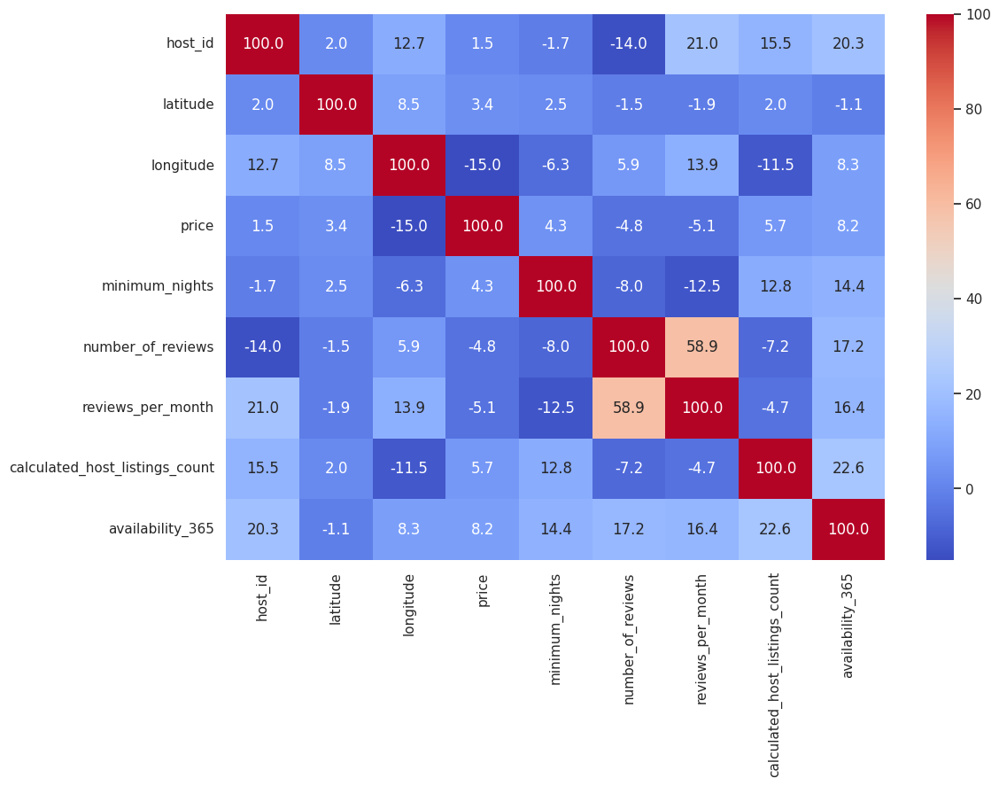

In [170]:
numdf = df.select_dtypes(include=['number'])
plt.figure(figsize=[12,8])
corr = numdf.corr() * 100 
sns.heatmap(corr, annot=True, fmt=".1f", cmap="coolwarm")


In [171]:
percentage_nbr=df.neighbourhood_group.value_counts(normalize = True) *100
percentage_nbr

neighbourhood_group
Manhattan       44.30
Brooklyn        41.12
Queens          11.59
Bronx            2.23
Staten Island    0.76
Name: proportion, dtype: float64

In [172]:
px.pie(percentage_nbr, values = percentage_nbr.values , names = percentage_nbr.index , title = 'Neighbourhood Group Distribution')

In [173]:
price_room_neighbour=df.groupby(['neighbourhood_group','room_type'])['price'].median().sort_values(ascending = False)
price_room_neighbour

neighbourhood_group  room_type      
Manhattan            Entire home/apt   191.00
Brooklyn             Entire home/apt   145.00
Queens               Entire home/apt   120.00
Bronx                Entire home/apt   100.00
Staten Island        Entire home/apt   100.00
Manhattan            Private room       90.00
                     Shared room        69.00
Brooklyn             Private room       65.00
Queens               Private room       60.00
Bronx                Private room       53.50
Staten Island        Private room       50.00
Bronx                Shared room        40.00
Queens               Shared room        37.00
Brooklyn             Shared room        36.00
Staten Island        Shared room        30.00
Name: price, dtype: float64

<Axes: xlabel='neighbourhood_group', ylabel='price'>

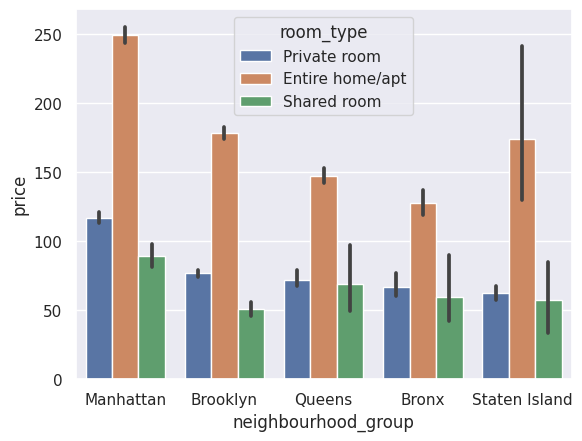

In [174]:
sns.barplot(df,x= 'neighbourhood_group', y= 'price',hue = 'room_type',order = df.neighbourhood_group.value_counts().index)


In [175]:
px.histogram(df, x = 'neighbourhood_group', y= 'price',color = 'room_type', facet_col = 'room_type', facet_col_wrap = 3 ,
            category_orders = {'neighbourhood_group':df.neighbourhood_group.value_counts().index},histfunc = 'avg')

In [176]:
pd.crosstab(index = df.room_type,columns =df.neighbourhood_group  , values = df.price , aggfunc = 'median')

neighbourhood_group,Bronx,Brooklyn,Manhattan,Queens,Staten Island
room_type,,,,,
Entire home/apt,100.00,145.00,191.00,120.00,100.00
Private room,53.50,65.00,90.00,60.00,50.00
Shared room,40.00,36.00,69.00,37.00,30.00


In [177]:
nrp=pd.pivot_table(df,index = 'room_type' ,columns = 'neighbourhood_group'  , values = 'price' , aggfunc = 'median')
nrp

neighbourhood_group,Bronx,Brooklyn,Manhattan,Queens,Staten Island
room_type,,,,,
Entire home/apt,100.00,145.00,191.00,120.00,100.00
Private room,53.50,65.00,90.00,60.00,50.00
Shared room,40.00,36.00,69.00,37.00,30.00


<Axes: xlabel='neighbourhood_group', ylabel='room_type'>

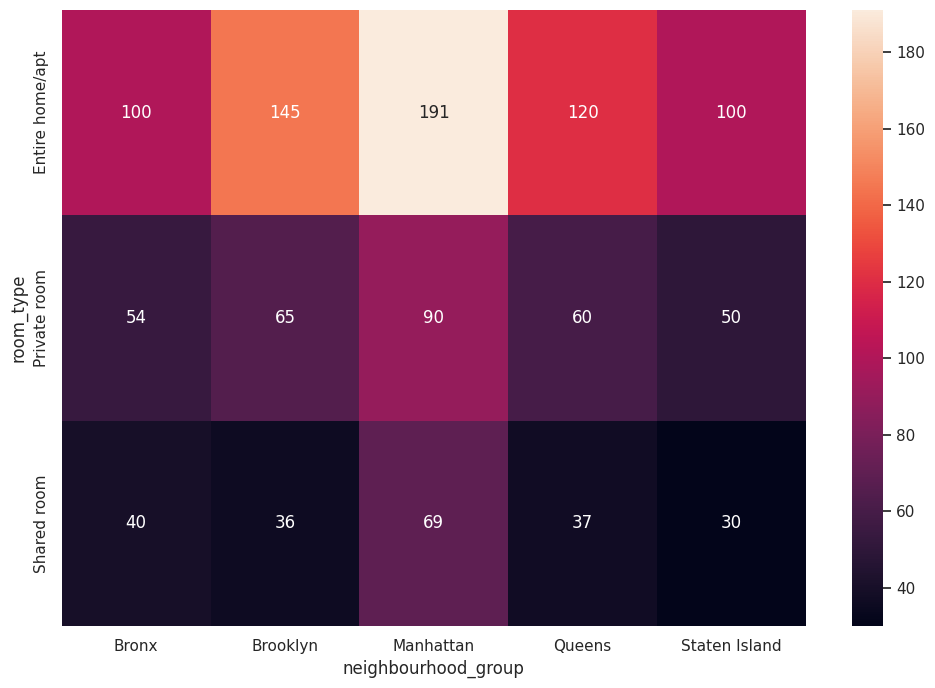

In [178]:
plt.figure(figsize=(12,8))
sns.heatmap(nrp,annot = True , fmt ='.0f')

In [179]:
neighbourhood_price = df.groupby('neighbourhood')['price'].median().reset_index().sort_values('price', ascending = False).head(10)

plt.figure(figsize=(12,8))
fig=px.bar(neighbourhood_price,y= 'price' ,x='neighbourhood',text='price',title="Top 10 Neighbourhoods by Median Price")
fig.show()

<Figure size 1200x800 with 0 Axes>

In [180]:
neighbourhood_price_room = df.groupby(['neighbourhood','room_type'])['price'].median().reset_index().sort_values('price', ascending = False).head(10)

px.bar(neighbourhood_price_room, x = 'neighbourhood', y= 'price',color = 'room_type',text='price', facet_col = 'room_type', facet_col_wrap = 3)

# The most expensive neighborhoods in New York City are:
## for Entire home/apt
- Fort Wadsworth
- Woodrow
the rest have comparable prices
## for Sharem room 
only Riverdale was provided
## for private room
also only Riverdale was provided

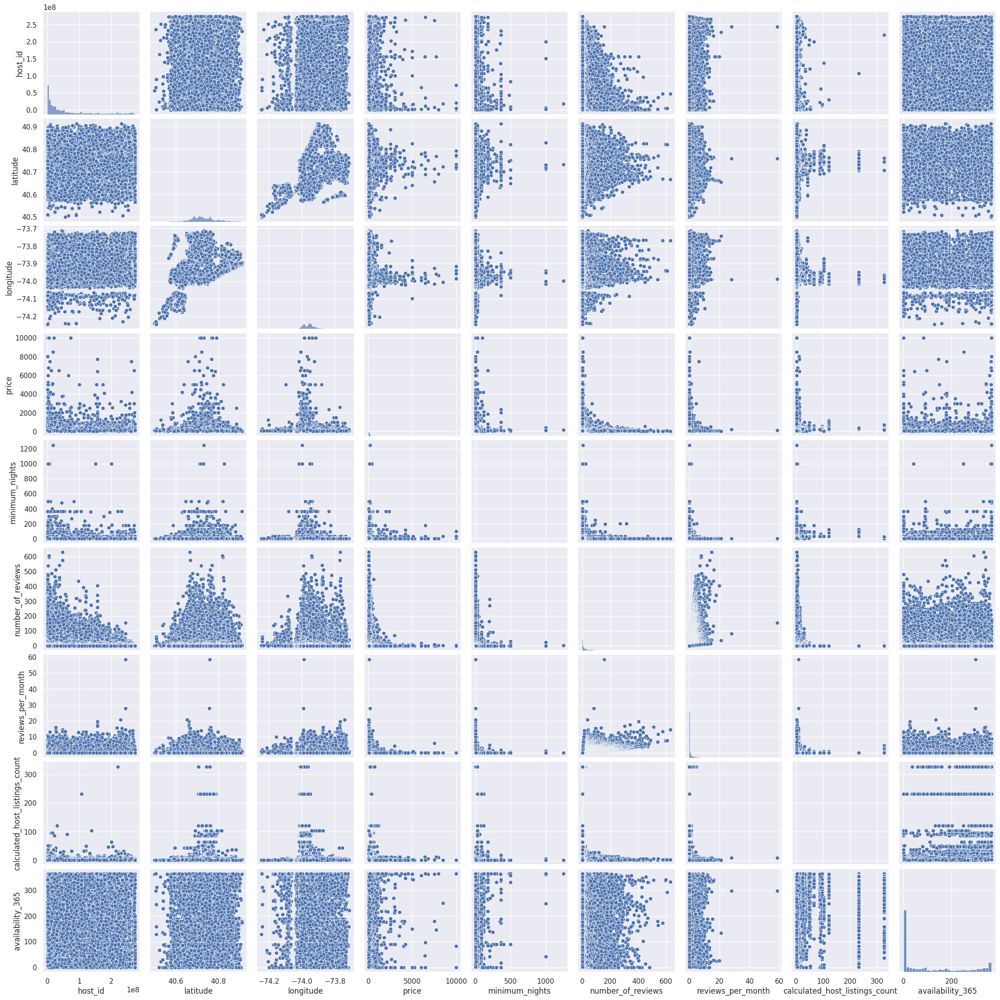

In [181]:
sns.pairplot(df)

In [182]:
low_price = df[df['price'] < 1000]
low_price


,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365
1,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.81,-73.94,Private room,150,3,0,2011-03-28,0.00,1,365
3,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.69,-73.96,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.80,-73.94,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,Charming one bedroom - newly renovated rowhouse,8232441,Brooklyn,Bedford-Stuyvesant,40.68,-73.95,Private room,70,2,0,2011-03-28,0.00,2,9
48891,Affordable room in Bushwick/East Williamsburg,6570630,Brooklyn,Bushwick,40.70,-73.93,Private room,40,4,0,2011-03-28,0.00,2,36
48892,Sunny Studio at Historical Neighborhood,23492952,Manhattan,Harlem,40.81,-73.95,Entire home/apt,115,10,0,2011-03-28,0.00,1,27
48893,43rd St. Time Square-cozy single bed,30985759,Manhattan,Hell's Kitchen,40.76,-73.99,Shared room,55,1,0,2011-03-28,0.00,6,2


In [183]:
low_price.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,"48,597.00","48,597.00","48,597.00","48,597.00","48,597.00","48,597.00",48597,"48,597.00","48,597.00","48,597.00"
mean,"67,635,294.89",40.73,-73.95,140.24,6.98,23.38,2017-03-24 08:50:33.076115712,1.10,7.17,112.37
min,"2,438.00",40.50,-74.24,0.00,1.00,0.00,2011-03-28 00:00:00,0.00,1.00,0.00
25%,"7,831,209.00",40.69,-73.98,69.00,1.00,1.00,2016-04-13 00:00:00,0.04,1.00,0.00
50%,"30,848,788.00",40.72,-73.96,105.00,3.00,5.00,2019-01-04 00:00:00,0.38,1.00,44.00
75%,"107,434,423.00",40.76,-73.94,175.00,5.00,24.00,2019-06-19 00:00:00,1.60,2.00,225.00
max,"274,321,313.00",40.91,-73.71,999.00,"1,250.00",629.00,2019-07-08 00:00:00,58.50,327.00,365.00
std,"78,601,451.05",0.05,0.05,112.91,20.28,44.65,NaN,1.60,33.04,131.38


In [184]:
fig = px.box(low_price, y="price")
fig.show()

In [185]:
fig = px.scatter(df, 
                 y='price', 
                 x='reviews_per_month',
                 color='room_type',
                 opacity=0.6,
                 title="Effect of Rating on Price")
fig.show()



In [186]:
fig = px.scatter(low_price, 
                 y='price', 
                 x='reviews_per_month',
                 color='room_type',
                 opacity=0.6,
                 title="Effect of Rating on Price Below 1000")
fig.show()


Reviews per month don't affect the price that much 

In [187]:
from geopy.distance import geodesic
from geopy.geocoders import Nominatim

In [188]:
city_center = (40.7128, -74.0060)
df['distance'] = df.apply(lambda row: geodesic(city_center, (row['latitude'], row['longitude'])).kilometers, axis=1)
df[['latitude','longitude','distance']].head(5)

,latitude,longitude,distance
0,40.65,-73.97,7.79
1,40.75,-73.98,4.91
2,40.81,-73.94,11.98
3,40.69,-73.96,4.97
4,40.80,-73.94,10.86


In [189]:
import folium
sample_df=df.sample(200,random_state = 42)
m = folium.Map(location=city_center, zoom_start=11)
folium.Marker(city_center, popup="City Center", icon=folium.Icon(color="red")).add_to(m)
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,
        popup=f"Name: {row['name']}Price: {row['price']} USD\nDistance: {row['distance']:.2f} km",
        color="blue",
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m

In [190]:
dp=df.groupby(['distance','neighbourhood_group','room_type'])['price'].mean().reset_index()
fig = px.histogram(
    dp,
    x='distance',
    y='price',
    #color = 'neighbourhood_group',
    facet_col = 'room_type',
    facet_col_wrap = 1,
    nbins=50,
    title="Effect of Distance from City Center on Price",
    labels={
        "distance": "Distance from City Center (km)",
        "price": "Price (USD)"
    },
    log_y=True
)
fig.update_layout(
    width=1600,   
    height=1200 )

fig.show()

**The Entrie Home/Apt is strongly correlated to the distance form NYC center but the shared and the private is less correlated**
please note that the price scale is Log(price) to make the graphs more informative 

In [191]:
counts = df['calculated_host_listings_count'].value_counts().sort_index().reset_index()
counts.columns = ['calculated_host_listings_count', 'host_count']

fig = px.line(
    counts,
    x='calculated_host_listings_count',
    y='host_count',
    title="Distribution of Listings per Host",
    labels={
        "calculated_host_listings_count": "Number of Listings per Host",
        "host_count": "Count of Hosts"
    }
)

fig.update_layout(width=1000, height=500)
fig.show()

In [192]:
chlc = df.groupby('calculated_host_listings_count')['number_of_reviews'].mean().reset_index()
fig = px.line(chlc , x ='calculated_host_listings_count', y= 'number_of_reviews',
              title="Average Number of Reviews per Host by Number of Listings",
              labels={
                  "calculated_host_listings_count": "Number of Listings per Host",
                  "avg_number_of_reviews": "Average Number of Reviews"
    })
fig.show()

In [193]:
chlc = df.groupby('calculated_host_listings_count')['reviews_per_month'].mean().reset_index()
fig = px.line(chlc , x ='calculated_host_listings_count', y= 'reviews_per_month',
              title="Average Number of Reviews per Host by Number of Listings",
              labels={
                  "calculated_host_listings_count": "Number of Listings per Host",
                  "avg_number_of_reviews_per_month": "Average Number of Reviews per month"
    })
fig.show()

it seems that the people tend to leave less reviews to owners with high number of properties 


In [194]:
ava=df.groupby('availability_365')['price'].mean().reset_index()
fig = px.bar (ava , x = 'availability_365', y = 'price' )
fig.show()

The availability doesn't affect the price too much 

# Insights 
- Most listings are in Manhattan and Brooklyn.

- Entire home/apt is the most common type, followed by Private room, while Shared room is rare.

- Some neighbourhoods have mostly one room type, which affects prices.

- Prices vary a lot; there are very high outliers → using log scale helps.

- Most listings are under $1000, but some go much higher.

- Entire home/apt is more expensive than private or shared rooms.

- Listings closer to city center (Manhattan) tend to be more expensive.

- Having more listings doesn’t necessarily mean higher reviews.

- Numerical features like price, minimum_nights, number_of_reviews, reviews_per_month, calculated_host_listings_count show weak to moderate correlation.

- Price is more affected by room type and neighbourhood group than by numerical features
